# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## Import Relevant Packages

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib qt

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML


## 1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images

In [2]:
#Calibrates Camera based on images taken in chessboard size

def camera_calibrate(images,save):
    
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
     
    for index, fname in enumerate (images):
        img = mpimg.imread(fname)   

        ori = np.copy(img)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

         # Draw and display the corners
            cv2.drawChessboardCorners(img, (9,6), corners, ret)
            save_file_name = save +'corners_found'+str(index + 1)+'.jpg'
            cv2.imwrite(save_file_name, img)
            plt.imshow(img)
            plt.show()
            
    #Calibration  
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints,imgpoints,img.shape[1::-1], None, None) 
                  
    return mtx,dist, ori, img

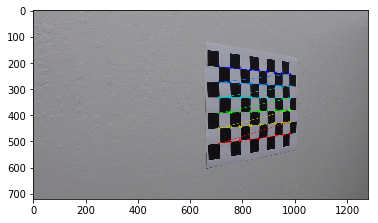

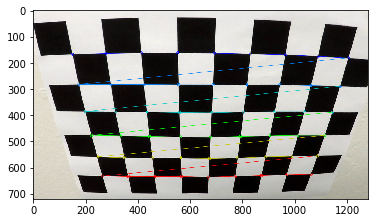

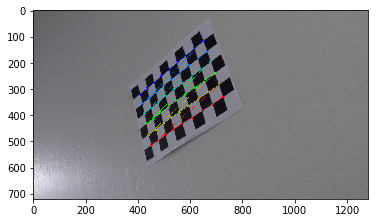

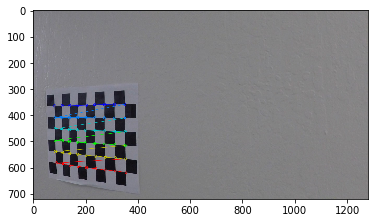

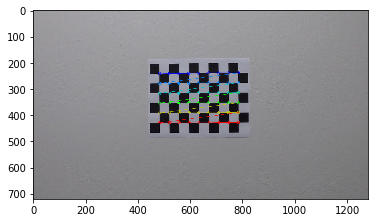

...

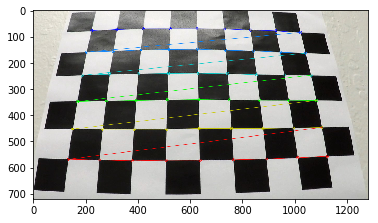

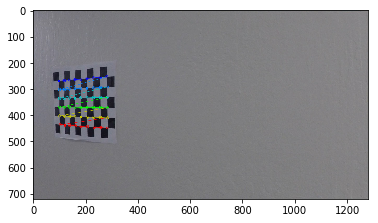

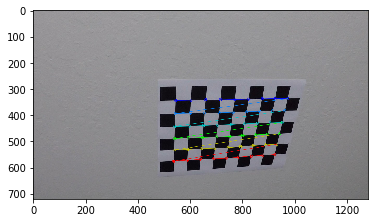

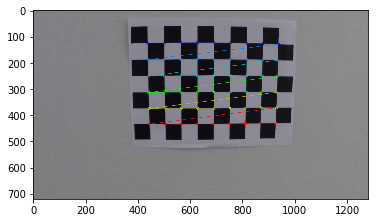

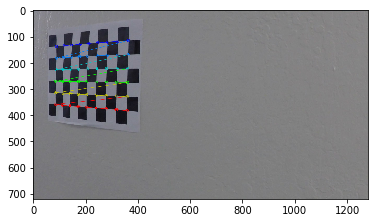

In [3]:
#Visualization    
images = glob.glob('camera_cal/calibration*.jpg')
save = 'camera_cal/'

mtx,dist, ori, img = camera_calibrate(images,save)


#Save camera calibration result as a pickle
cal_pickle = {}
cal_pickle['mtx'] = mtx
cal_pickle['dist'] = dist
with open('camera_cal/cal_pickle.p','wb') as output_file:
    pickle.dump(cal_pickle, output_file)
    

## 2. Apply a distortion correction to raw images

In [4]:
#Load the camera calibration result
with open('camera_cal/cal_pickle.p', 'rb') as input_file:
    p = pickle.load(input_file)
mtx = p['mtx']
dist = p['dist']

#Undistorting an image
def cal_undistort(img,mtx,dist):
    
    ori = np.copy(img)
    undst = cv2.undistort(img, mtx, dist, None, mtx)
      
    return undst,ori

   

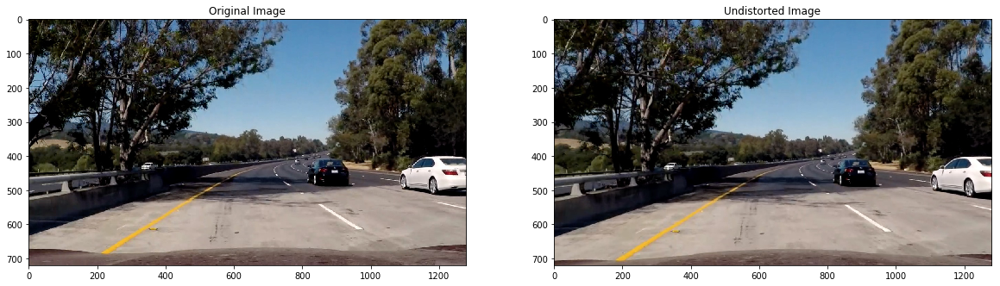

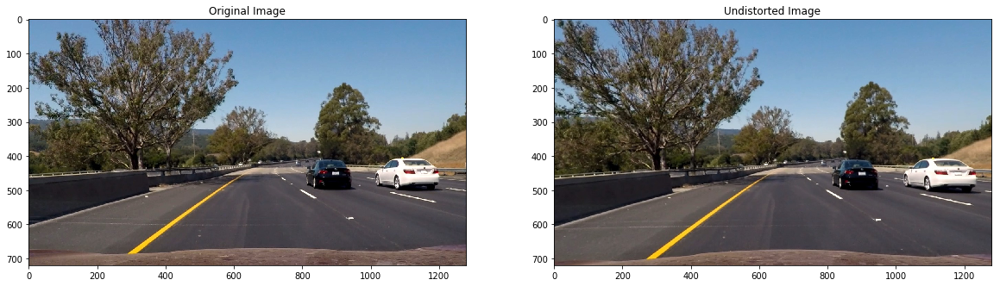

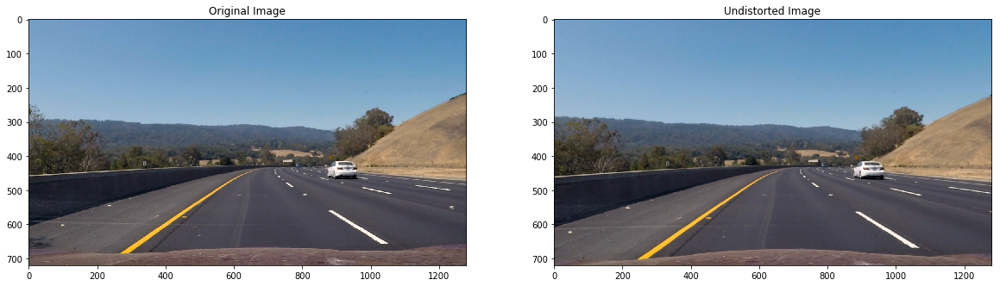

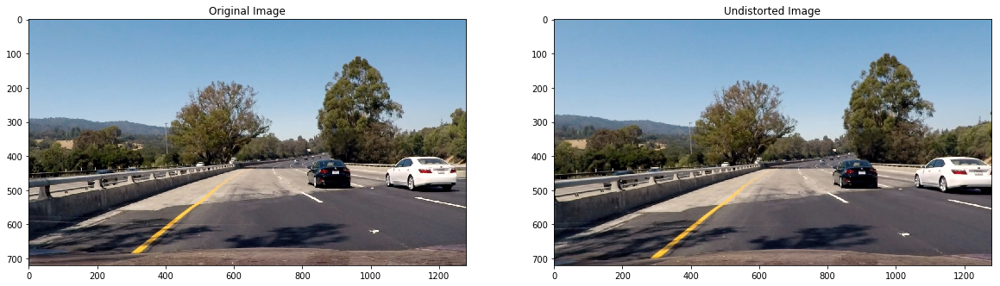

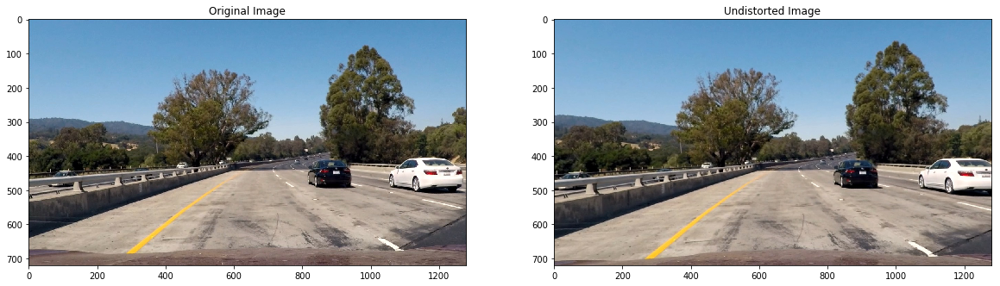

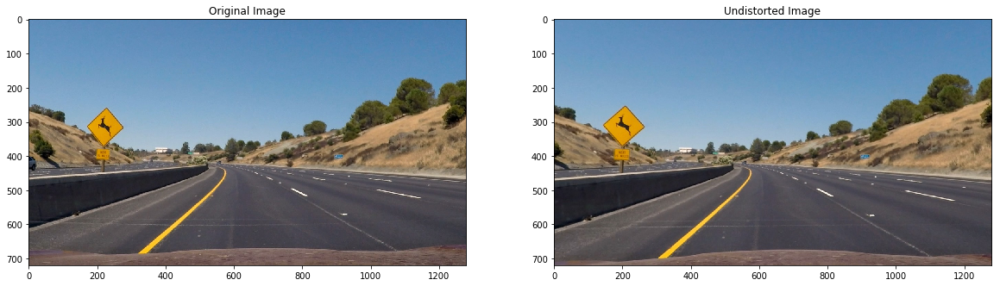

In [5]:
#Visualization

# Make a list of images
images = glob.glob('test_images/test*.jpg')
#images = glob.glob('camera_cal/calibration*.jpg') # test for chessboard images

for index, fname in enumerate (images):
    img = mpimg.imread(fname)
    undst,ori = cal_undistort(img,mtx,dist)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(ori)
    ax1.set_title('Original Image')
    ax2.imshow(undst)
    ax2.set_title('Undistorted Image')     

## 3. Use color transforms, gradients, etc., to create a thresholded binary image

In [6]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh_min=0,thresh_max= 255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as your binary_output image
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image

    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def s_select(img, thresh=(0, 255)):
    
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]
    # Apply a threshold to the S channel
    binary_output = np.zeros_like(s)
    binary_output[(s > thresh[0]) & (s <= thresh[1])] = 1
   
    # Return a binary image 
    return binary_output

# Define a function that thresholds the h-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def h_select(img, thresh=(0, 255)):
    
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h = hls[:,:,0]
    # Apply a threshold to the h channel
    binary_output = np.zeros_like(h)
    binary_output[(h > thresh[0]) & (h <= thresh[1])] = 1
   
    # Return a binary image 
    return binary_output
 
#Applies a Gaussian Noise kernel    
def gaussian_blur(img, kernel_size):

    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

In [7]:
# Define a function and apply each of the thresholding functions
def threshold(ksize,img):# Choose a Sobel kernel size
#ksize = 15 # Choose a larger odd number to smooth gradient measurements
    
    #Apply gaussian blurring
    blur_img = gaussian_blur(img, 5) #defined kernel size for gaussion smoothing    
    
    ori = np.copy(blur_img)
    gray =  cv2.cvtColor(blur_img, cv2.COLOR_RGB2GRAY)
    hls = cv2.cvtColor(blur_img, cv2.COLOR_RGB2HLS)
    
    gradx = abs_sobel_thresh(blur_img, orient='x', sobel_kernel=ksize, thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(blur_img, orient='y', sobel_kernel=ksize, thresh_min=20, thresh_max=100)
    mag_binary = mag_thresh(blur_img, sobel_kernel=ksize, mag_thresh=(120, 255))
    dir_binary = dir_threshold(blur_img, sobel_kernel=ksize, thresh=(0.7, 1.3))
 
    s_binary = s_select(blur_img, thresh = (100,255))
    h_binary = h_select(blur_img, thresh = (0,30))
 
    combinedb= np.zeros_like(dir_binary)
    combinedb[((gradx == 1) & (grady == 1) | (mag_binary == 1) & (dir_binary ==1))] = 1
    hls= np.zeros_like(h_binary & s_binary)
    hls[((s_binary == 1) & (h_binary == 1))] = 1
    
    #combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | ((s_binary == 1) & (h_binary == 1))] = 1
    #combined[(((gradx == 1) & (mag_binary == 1))| (s_binary == 1))] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack((combinedb, combinedb, hls)) * 255
    
    # Combine the two binary thresholds
    combined = np.zeros_like(gray)
    combined[(hls == 1) | (combinedb == 1)] = 1
    
    return combined, ori



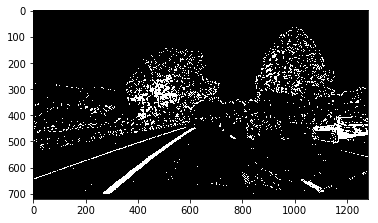

In [8]:
#Visualization

img = mpimg.imread('test_images/test1.jpg')
#img = mpimg.imread('test_images/straight_lines1.jpg')    
    
undst,ori = cal_undistort(img,mtx,dist) # get undistorted
threshold_bin, ori = threshold(15,undst) #get thresholded, undistorted binary image
plt.imshow(threshold_bin,cmap='gray')


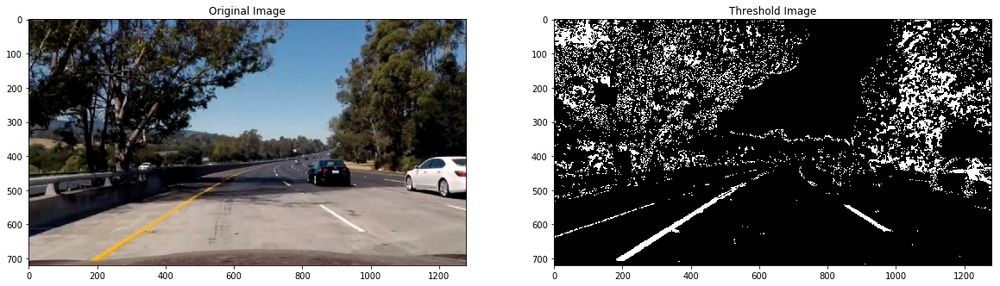

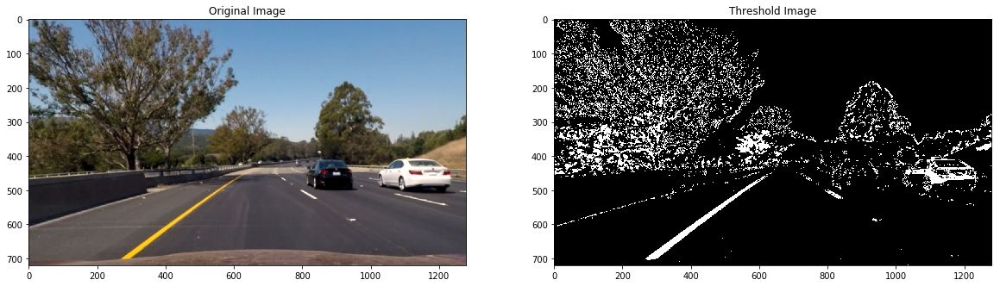

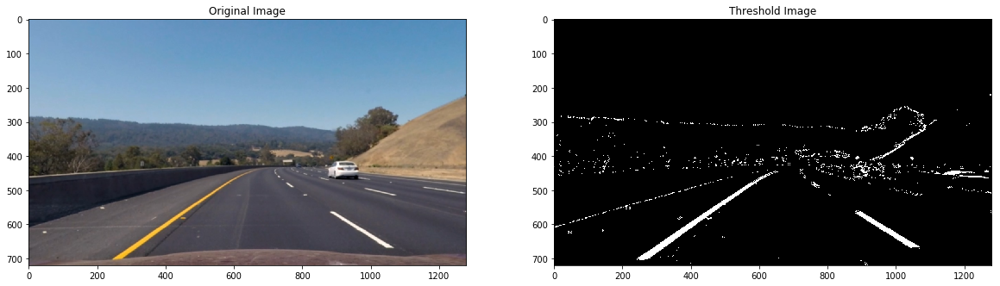

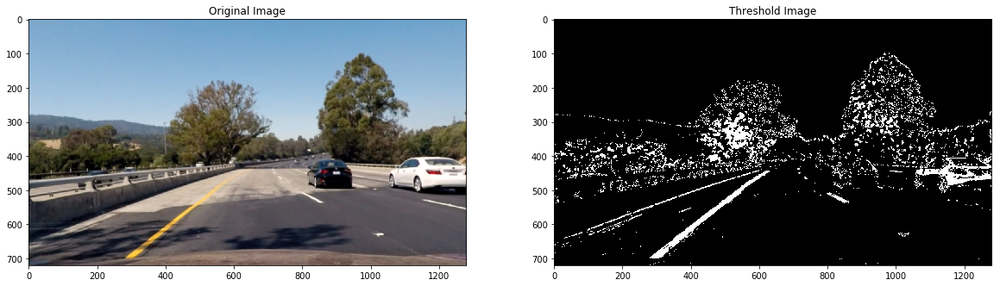

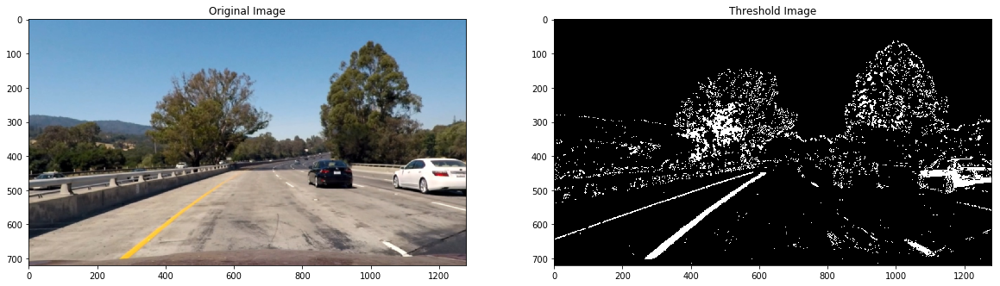

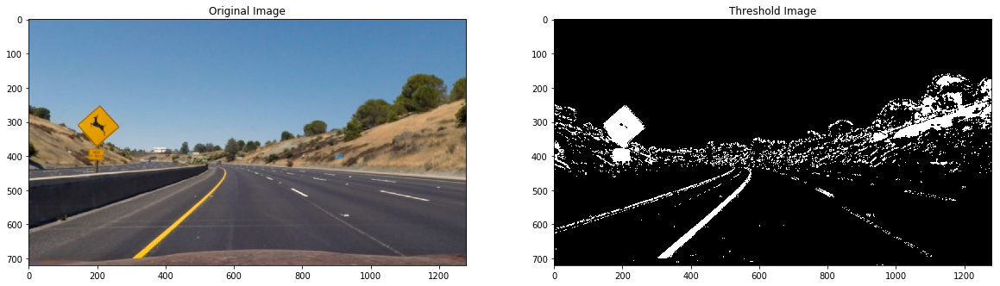

In [9]:
# Make a list of images
images = glob.glob('test_images/test*.jpg')

for index, fname in enumerate (images):
    img = mpimg.imread(fname)
    undst,ori = cal_undistort(img,mtx,dist) #use undistorted image
    threshold_bin, ori = threshold(15,undst)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(ori)
    ax1.set_title('Original Image')
    ax2.imshow(threshold_bin,cmap='gray')
    ax2.set_title('Threshold Image')        

## 4. Apply a perspective transform to rectify binary image ("birds-eye view")

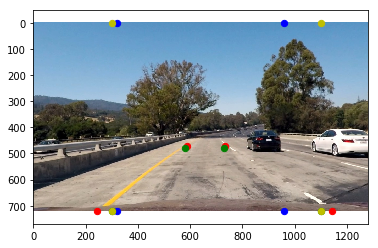

In [10]:
#Figuring out positions for persepective transfrom 

img = mpimg.imread('test_images/test1.jpg')
#img = mpimg.imread('test_images/straight_lines1.jpg')

undst,ori = cal_undistort(img,mtx,dist) #use undistorted image

plt.imshow(undst)
plt.scatter(x=[588, 245, 1142, 734], y=[470, 719, 719, 470], c='r', s=40)
plt.scatter(x=[320, 320, 960, 960], y=[0, 720, 720, 0], c='b', s=40)

#src = np.float32([[588,470], [245,719], [1142, 719],[734,470]])
#dst = np.float32([[320,0], [320,720], [960, 720],[960,0]])

plt.scatter(x=[300, 1100, 730, 580], y=[720, 720, 480, 480], c='g', s=40)
plt.scatter(x=[300, 300, 1100, 1100], y=[720, 0, 0, 720], c='y', s=40)

#src = np.float32([(300,720),(1100,720),(730,480),(580,480)])
#dst = np.float32([(300,720),(1100,720),(1100,0),(300,0)])


In [11]:
#Apply perspective transformation

def perspective_transformation(img):
    
    #Hard coded values from above picture
    src = np.float32([[588,470], [245,719], [1142, 719],[734,470]])
    dst = np.float32([[320,0], [320,720], [960, 720],[960,0]])
    
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    
    return warped,Minv
    

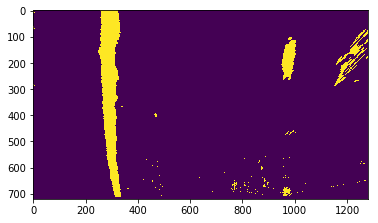

In [12]:
#Visualization

img = mpimg.imread('test_images/test1.jpg')
#img = mpimg.imread('test_images/straight_lines1.jpg')    
undst,ori = cal_undistort(img,mtx,dist) # get undistorted
threshold_bin, ori = threshold(15,undst) #get thresholded, undistorted binary image
warped,Minv = perspective_transformation(threshold_bin) #get warped, thresholded, undistorted binary image

plt.imshow(warped)

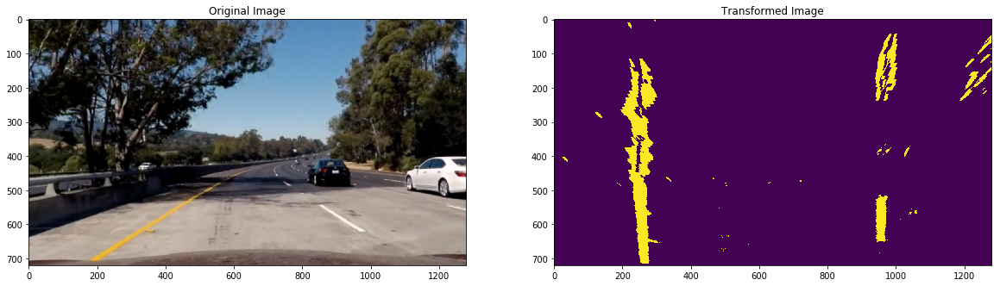

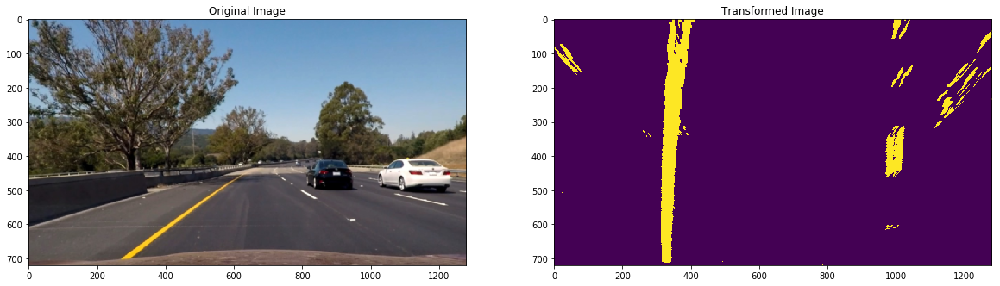

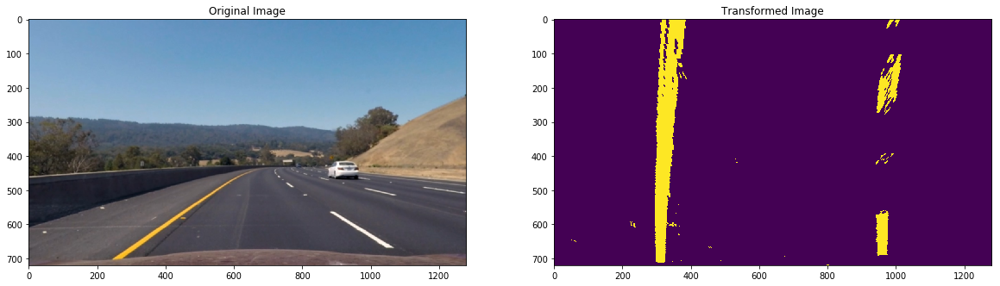

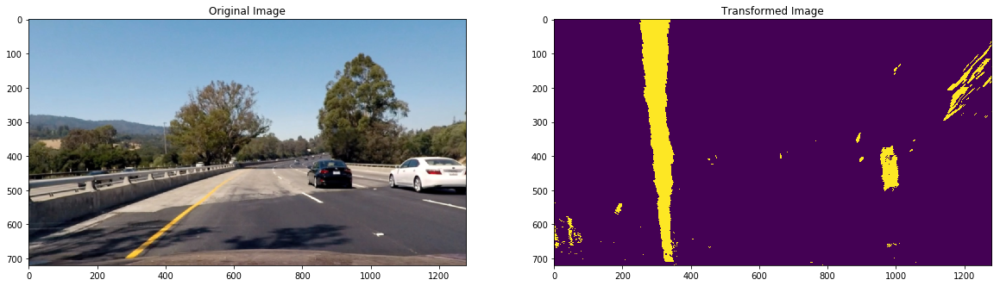

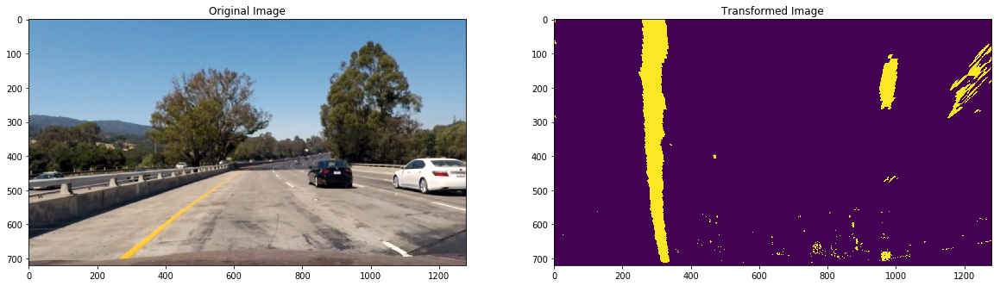

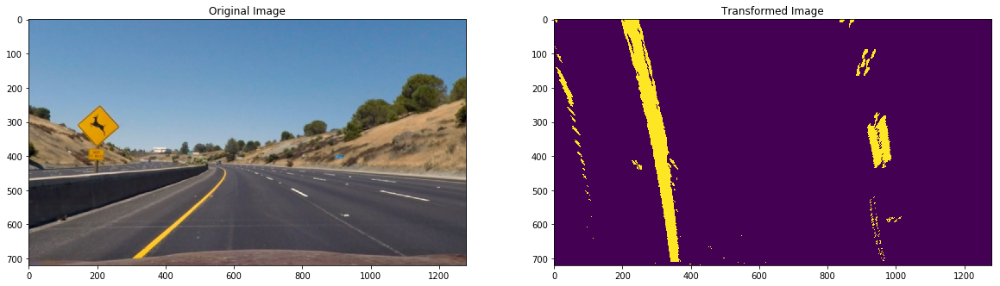

In [13]:
#Visualization
# Make a list of images
images = glob.glob('test_images/test*.jpg')

for index, fname in enumerate (images):
    img = mpimg.imread(fname)
    undst,ori = cal_undistort(img,mtx,dist) # get undistorted
    threshold_bin, ori = threshold(15,undst) #get thresholded, undistorted binary image
    warped,Minv = perspective_transformation(threshold_bin) #get warped, thresholded, undistorted binary image
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(ori)
    ax1.set_title('Original Image')
    ax2.imshow(warped)
    ax2.set_title('Transformed Image')        

## 5. Detect lane pixels and fit to find the lane boundary. 

In [14]:
#Lane finding method: Peaks in a Histogram 

def hist(img):

    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram


640 311 964


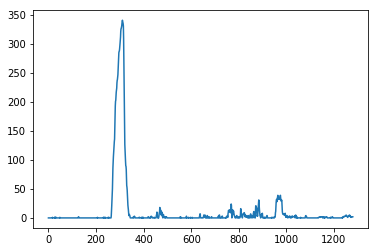

In [15]:
#Visualization

img = mpimg.imread('test_images/test1.jpg')
#img = mpimg.imread('test_images/straight_lines1.jpg')    
undst,ori = cal_undistort(img,mtx,dist) # get undistorted
threshold_bin, ori = threshold(15,undst) #get thresholded, undistorted binary image
warped,Minv = perspective_transformation(threshold_bin) #get warped, thresholded, undistorted binary image

histogram = hist(warped)

midpoint = np.int(histogram.shape[0]//2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Visualize the resulting histogram
plt.plot(histogram) #the two peaks are used as starting points
print(midpoint,leftx_base,rightx_base)

In [16]:
#Find lane pixels
def find_lane_pixels(img):
    
    #histogram function
    histogram = hist(img)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((img,img,img))

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 20
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(img.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        
        #the four below boundaries of the window
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        #Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        #nonzero pixels in x and y within the window 
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]     
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        #If found > minpix pixels, recenter next window
        #(`right` or `leftx_current`) on their mean position
        if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
                if len(good_right_inds) > minpix:        
                    rightx_current = np.int(np.mean(nonzerox[good_right_inds]))    
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    return leftx, lefty, rightx, righty, out_img

#Fit a second order polynomial
def fit_polynomial(img):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(img)
 
    # global variables to store the polynomial coefficients of the line detected in the last frame
    global left_fit
    global right_fit

    #Fit a second order polynomial to each using `np.polyfit`
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    #Visualization
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    #Uncomment for visualization test
    # Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='white')
    #plt.plot(right_fitx, ploty, color='white')

    
    return left_fit, right_fit, out_img, ploty
    


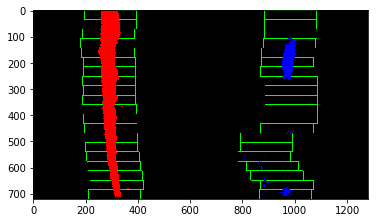

In [17]:
#Visualization

img = mpimg.imread('test_images/test1.jpg')
#img = mpimg.imread('test_images/straight_lines1.jpg')    
undst,ori = cal_undistort(img,mtx,dist) # get undistorted
threshold_bin, ori = threshold(15,undst) #get thresholded, undistorted binary image
warped,Minv = perspective_transformation(threshold_bin) #get warped, thresholded, undistorted binary image

left_fit, right_fit, out_img, ploty = fit_polynomial(warped) #line, polynomial fitting

plt.imshow(out_img)


In [18]:
#lane lines don't necessarily move a lot from frame to frame.
#don't need to do a blind search again, 
#but instead you can just search in a margin around the previous lane line position
#The green shaded area shows where we searched for the lines this time

def fit_from_prior_fit_polynomial(img, prior_left_fit, prior_right_fit):
    
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = 100

    # Grab activated pixels
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    #Set the area of search based on activated x-values  within the +/- margin of our polynomial function
    left_lane_inds = ((nonzerox > (prior_left_fit[0]*(nonzeroy**2) + prior_left_fit[1]*nonzeroy + 
                    prior_left_fit[2] - margin)) & (nonzerox < (prior_left_fit[0]*(nonzeroy**2) + 
                    prior_left_fit[1]*nonzeroy + prior_left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (prior_right_fit[0]*(nonzeroy**2) + prior_right_fit[1]*nonzeroy + 
                    prior_right_fit[2] - margin)) & (nonzerox < (prior_right_fit[0]*(nonzeroy**2) + 
                    prior_right_fit[1]*nonzeroy + prior_right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # global variables to store the polynomial coefficients of the line detected in the last frame
    global left_fit
    global right_fit
    
    #Fit a second order polynomial to each using `np.polyfit`
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty


    #Visualization
    # Colors in the left and right lane regions
    img[lefty, leftx] = [255, 0, 0]
    img[righty, rightx] = [0, 0, 255]
    
    undst,ori = cal_undistort(img,mtx,dist) # get undistorted
    threshold_bin, ori = threshold(15,undst) #get thresholded, undistorted binary image
    original,Minv = perspective_transformation(threshold_bin) #get warped, thresholded, undistorted binary image
    
    
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img1 = np.dstack((original,original,original))*255
    window_img = np.zeros_like(out_img1)
    # Color in left and right line pixels
    out_img1[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img1[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    #Uncomment for visualization test
    # Plot the polynomial lines onto the image
    #plt.plot(left_fitx, ploty, color='black')
    #plt.plot(right_fitx, ploty, color='black')
    ## End visualization steps ##
    
    return left_fit, right_fit, result ,ploty

In [19]:
#This is equivalent to using a customized region of interest for each frame of video, 
#and should help you track the lanes through sharp curves and tricky conditions. 
#If you lose track of the lines, go back to your sliding windows search or other method to rediscover them.

def lane_detection(left_fit, right_fit, img):
    
    # If left,right fit found from sliding windows method, do a targetted search instead
    if (left_fit is not None) & (right_fit is not None):
        left_fit, right_fit, result, ploty =  fit_from_prior_fit_polynomial(img,left_fit,right_fit)   
    
    #If lost frame, start sliding windows seach 
    else:
        left_fit, right_fit, result, ploty = fit_polynomial(img)    
    
    return left_fit, right_fit, result, ploty

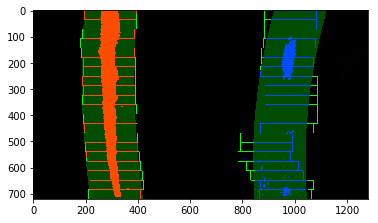

In [20]:
#Visualization

img = mpimg.imread('test_images/test1.jpg')
#img = mpimg.imread('test_images/straight_lines1.jpg')    
undst,ori = cal_undistort(img,mtx,dist) # get undistorted
threshold_bin, ori = threshold(15,undst) #get thresholded, undistorted binary image
warped,Minv = perspective_transformation(threshold_bin) #get warped, thresholded, undistorted binary image
left_fit, right_fit, out_img, ploty = fit_polynomial(warped) #line, polynomial fitting

#line, polynomial fitting but reduce sliding window method
left_fit, right_fit, result, ploty = lane_detection(left_fit, right_fit, out_img)  
 
#both white and black line commands are commented to prevent interference with final result
#if visualization intended, uncomment them
#white line is from sliding windows method 'fit_polynomial()''
#black line is with updated polynomial fitting 'fit_from_prior_polynomial'
    
plt.imshow(result)


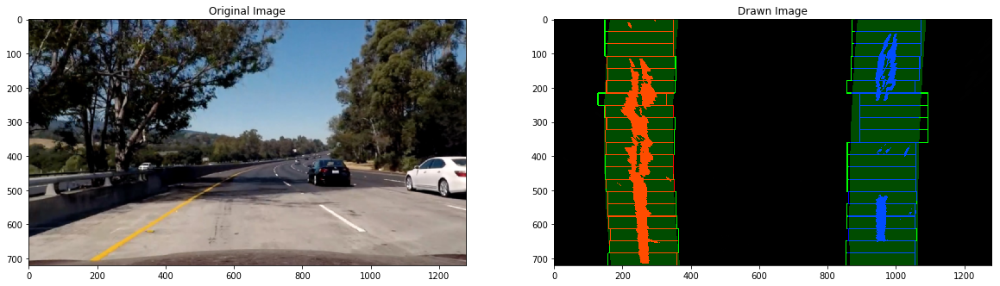

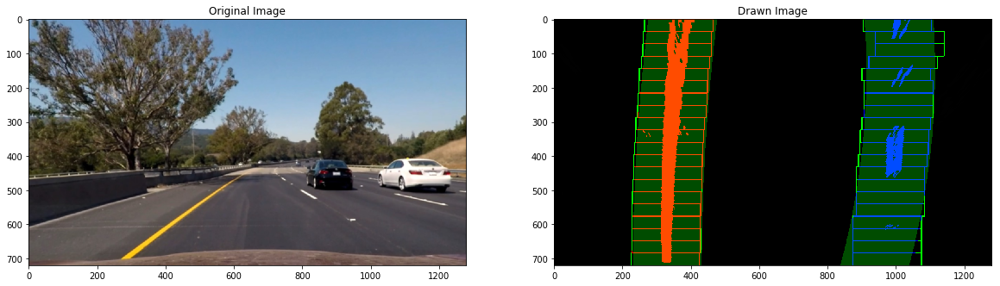

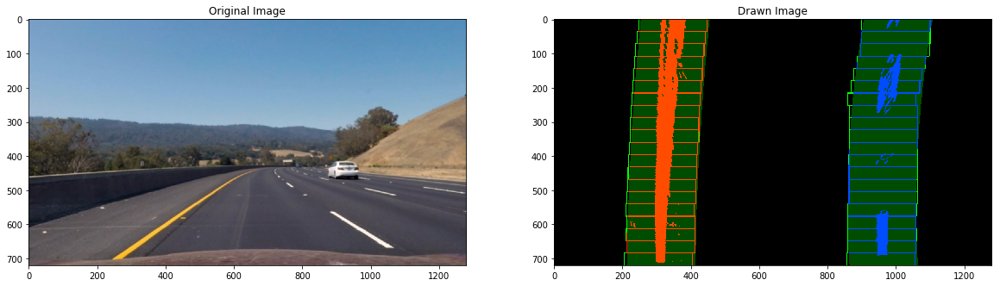

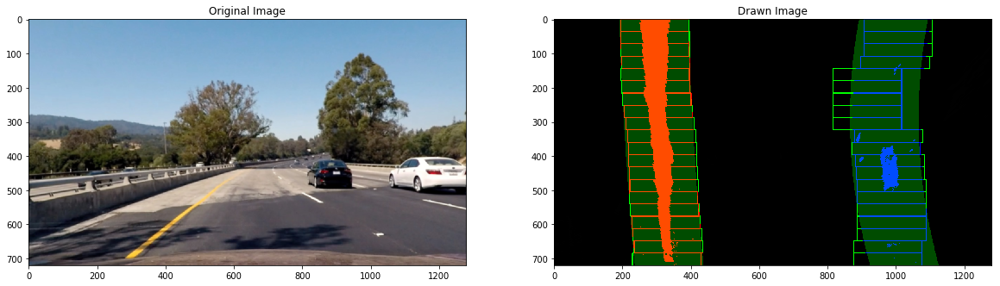

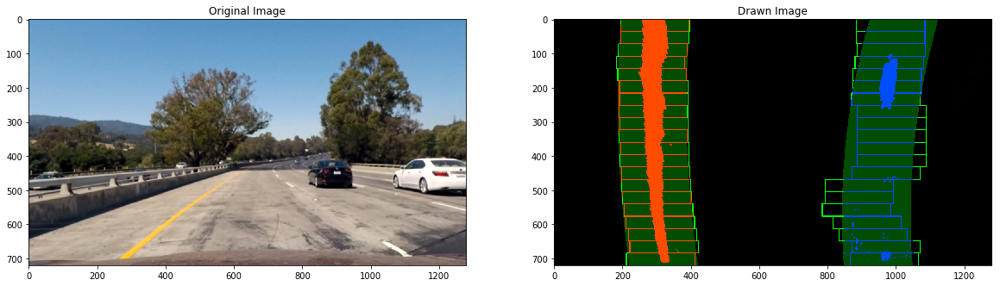

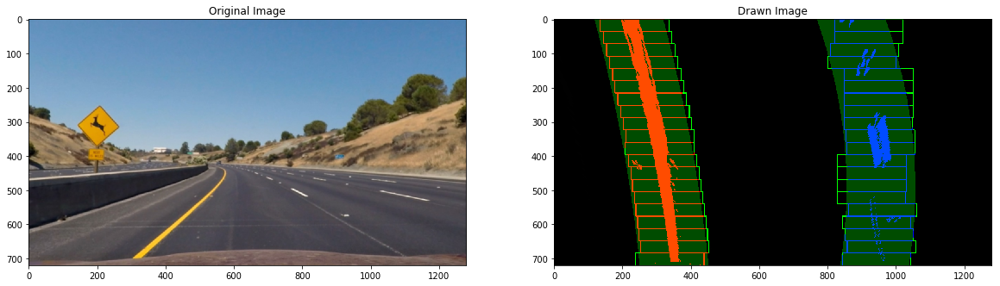

In [21]:
# Make a list of images

images = glob.glob('test_images/test*.jpg')

for index, fname in enumerate (images):
    img = mpimg.imread(fname)
    undst,ori = cal_undistort(img,mtx,dist) # get undistorted
    threshold_bin, ori = threshold(15,undst) #get thresholded, undistorted binary image
    warped,Minv = perspective_transformation(threshold_bin) #get warped, thresholded, undistorted binary image
    left_fit, right_fit, out_img, ploty = fit_polynomial(warped) #line, polynomial fitting
    #line, polynomial fitting but reduce sliding window method
    left_fit, right_fit, result, ploty = lane_detection(left_fit, right_fit, out_img)  
    
    #white line is from sliding windows method 'fit_polynomial()''
    #black line is with updated polynomial fitting 'fit_from_prior_polynomial'
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(ori)
    ax1.set_title('Original Image')
    ax2.imshow(result)
    ax2.set_title('Drawn Image') 

## 6. Determine the curvature of the lane and vehicle position with respect to center.

In [22]:
#Calculates the curvature of polynomial functions in meters. 
def measure_curvature_real(left_fit, right_fit, ploty):
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    #Implement the calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    #radius
    radius = np.mean([left_curverad, right_curverad])


    return left_curverad, right_curverad , radius

#Calculate offset of car assuming dashcam is mounted at car centerline
def measure_offset(img, left_fit, right_fit, ploty):
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    #finding max x,y meters per pixel 
    x_max = img.shape[1]*xm_per_pix
    y_max = img.shape[0]*ym_per_pix
    
    #Car centerline 
    center = x_max/2
    
    #Generate x and y values
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
     
    # Fit a second order polynomial to each using `np.polyfit`
    left_fit_m = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_m = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)

    left_line = left_fit_m[0]*y_max**2 + left_fit_m[1]*y_max + left_fit_m[2]
    right_line = right_fit_m[0]*y_max**2 + right_fit_m[1]*y_max + right_fit_m[2]
    
    middle_line = left_line + (right_line - left_line) /2
    
    #Calculate offset of middeline and center of car
    offset = middle_line - center
    
    return offset 

 

left_curverad: 3213.80317092 right_curverad: 2255.30371423 radius: 2734.55344258
offset: -0.033928702733


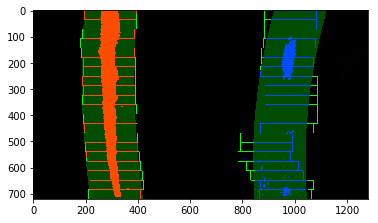

In [23]:
#Visualization

img = mpimg.imread('test_images/test1.jpg')
#img = mpimg.imread('test_images/straight_lines1.jpg')    
undst,ori = cal_undistort(img,mtx,dist) # get undistorted
threshold_bin, ori = threshold(15,undst) #get thresholded, undistorted binary image
warped,Minv = perspective_transformation(threshold_bin) #get warped, thresholded, undistorted binary image
left_fit, right_fit, out_img, ploty = fit_polynomial(warped) #line, polynomial fitting

#line, polynomial fitting but reduce sliding window method
left_fit, right_fit, result, ploty = lane_detection(left_fit, right_fit, out_img)  

left_curverad, right_curverad, radius = measure_curvature_real(left_fit, right_fit, ploty)# get measurements
offset = measure_offset (result, left_fit, right_fit, ploty) # if positive, to the right, negative, to the left


#white line is from sliding windows method 'fit_polynomial()''
#black line is with updated polynomial fitting 'fit_from_prior_polynomial'
    
plt.imshow(result)
print ('left_curverad:',left_curverad, 'right_curverad:', right_curverad, 'radius:', radius)
print ('offset:', offset)

## 7. Warp the detected lane boundaries back onto the original image.

In [24]:
#Function to draw identified lane lines back to road

def draw(left_fit, right_fit, ploty, Minv, warped, undst):
    
    #Generate x and y values
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(undst, 1, newwarp, 0.3, 0)
    
    return result

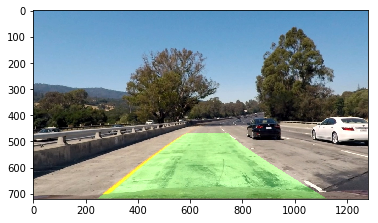

In [25]:
#Visualization

img = mpimg.imread('test_images/test1.jpg')
#img = mpimg.imread('test_images/straight_lines1.jpg')    
undst,ori = cal_undistort(img,mtx,dist) # get undistorted
threshold_bin, ori = threshold(15,undst) #get thresholded, undistorted binary image
warped,Minv = perspective_transformation(threshold_bin) #get warped, thresholded, undistorted binary image
left_fit, right_fit, out_img, ploty = fit_polynomial(warped) #line, polynomial fitting

#line, polynomial fitting but reduce sliding window method
left_fit, right_fit, result, ploty = lane_detection(left_fit, right_fit, out_img)  

left_curverad, right_curverad, radius = measure_curvature_real(left_fit, right_fit, ploty)# get measurements
offset = measure_offset (result, left_fit, right_fit, ploty) # if positive, to the right, negative, to the left

result = draw(left_fit, right_fit, ploty, Minv, warped, undst) #project line detection on image
    
    
plt.imshow(result)


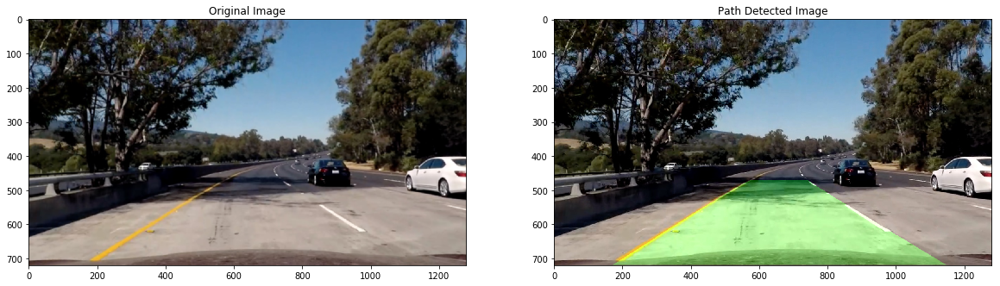

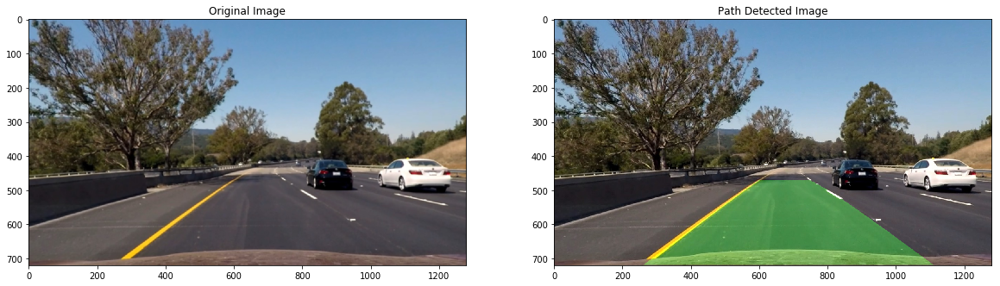

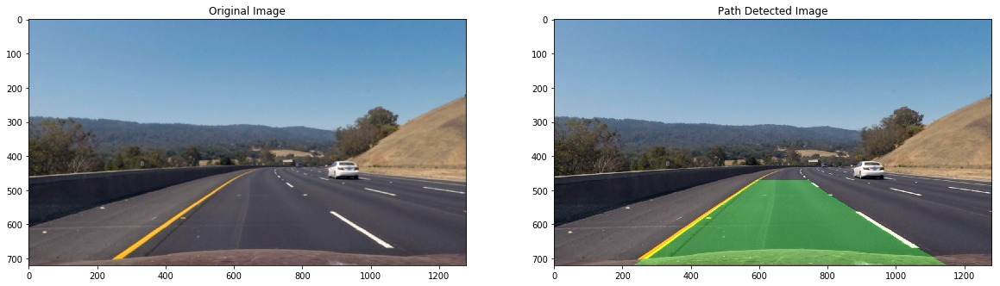

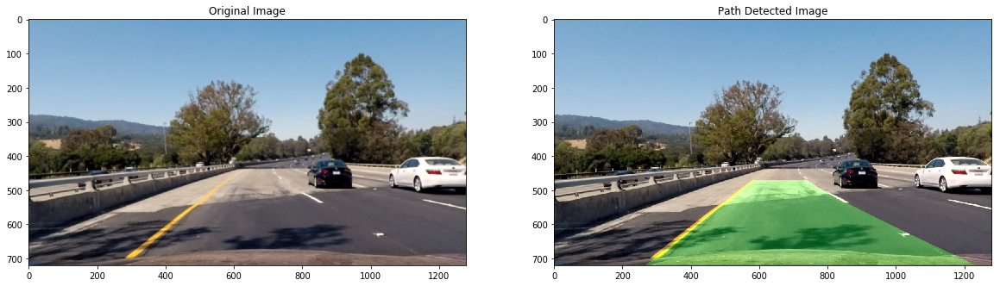

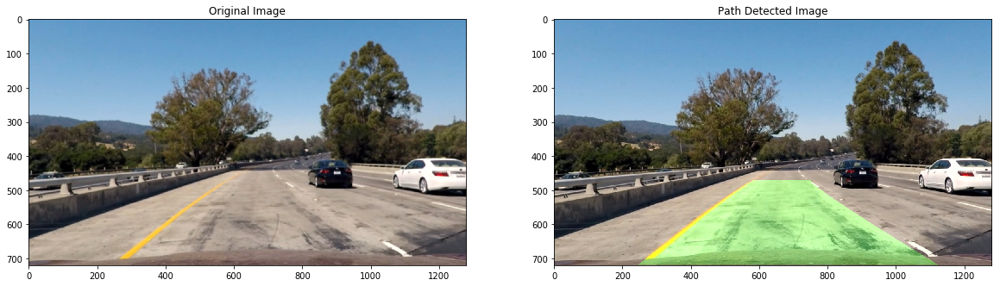

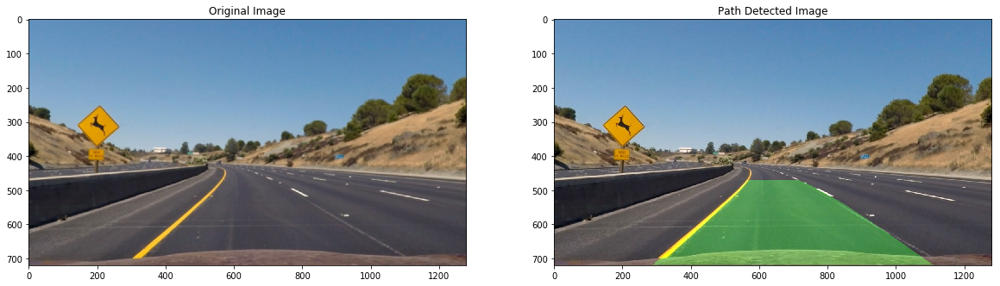

In [26]:
# Make a list of images

images = glob.glob('test_images/test*.jpg')

for index, fname in enumerate (images):
    img = mpimg.imread(fname)
    undst,ori = cal_undistort(img,mtx,dist) # get undistorted
    threshold_bin, ori = threshold(15,undst) #get thresholded, undistorted binary image
    warped,Minv = perspective_transformation(threshold_bin) #get warped, thresholded, undistorted binary image
    left_fit, right_fit, out_img, ploty = fit_polynomial(warped) #line, polynomial fitting

    #line, polynomial fitting but reduce sliding window method
    left_fit, right_fit, result, ploty = lane_detection(left_fit, right_fit, out_img)  

    left_curverad, right_curverad, radius = measure_curvature_real(left_fit, right_fit, ploty)# get measurements
    offset = measure_offset (result, left_fit, right_fit, ploty) # if positive, to the right, negative, to the left

    result = draw(left_fit, right_fit, ploty, Minv, warped, undst) #project line detection on image

    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(ori)
    ax1.set_title('Original Image')
    ax2.imshow(result)
    ax2.set_title('Path Detected Image') 

## 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [27]:
#displays both left,right curverad, radius and offsets on image

def add_display(result, left_curverad, right_curverad, radius, offset):
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    
    cv2.putText(result, 'Radius of Curvature: %d m' % radius, (10,50), font, 1.5,(255,255,255),3)
    cv2.putText(result, 'Left of Curvature: %d m' % left_curverad, (810,45), font, 1,(255,255,255),3)
    cv2.putText(result, 'Right of Curvature: %d m' % right_curverad, (810,95), font, 1,(255,255,255),3) 
    cv2.putText(result, 'Offset: %.4f m' % offset, (810,145), font, 1,(255,255,255),3)
    
    if offset >= 0:
        cv2.putText(result, 'Car is %.4f m right of center ' % offset, (10,110), font, 1.5,(255,255,255),3)
    else:
        cv2.putText(result, 'Car is %.4f m left of center ' % -offset, (10,110), font, 1.5,(255,255,255),3)
        
    return result
    
#syntax for putting font
#cv2.putText(image, text, org, font, fontScale, color[, thickness[, lineType[, bottomLeftOrigin]]])

#Parameters:
    #image: It is the image on which text is to be drawn.
    #text: Text string to be drawn.
    #org: It is the coordinates of the bottom-left corner of the text string in the image. The coordinates are represented as tuples of two values i.e. (X coordinate value, Y coordinate value).
    #font: It denotes the font type. Some of font types are FONT_HERSHEY_SIMPLEX, FONT_HERSHEY_PLAIN, , etc.
    #fontScale: Font scale factor that is multiplied by the font-specific base size.
    #color: It is the color of text string to be drawn. For BGR, we pass a tuple. eg: (255, 0, 0) for blue color.
    #thickness: It is the thickness of the line in px.
    #lineType: This is an optional parameter.It gives the type of the line to be used.
    #bottomLeftOrigin: This is an optional parameter. When it is true, the image data origin is at the bottom-left corner. Otherwise, it is at the top-left corner.

#Return Value: It returns an image. 
    
    

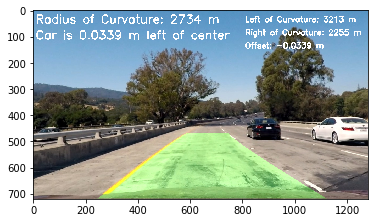

In [28]:
#Visualization

img = mpimg.imread('test_images/test1.jpg')
#img = mpimg.imread('test_images/straight_lines1.jpg')    
undst,ori = cal_undistort(img,mtx,dist) # get undistorted
threshold_bin, ori = threshold(15,undst) #get thresholded, undistorted binary image
warped,Minv = perspective_transformation(threshold_bin) #get warped, thresholded, undistorted binary image
left_fit, right_fit, out_img, ploty = fit_polynomial(warped) #line, polynomial fitting

#line, polynomial fitting but reduce sliding window method
left_fit, right_fit, result, ploty = lane_detection(left_fit, right_fit, out_img)  

left_curverad, right_curverad, radius = measure_curvature_real(left_fit, right_fit, ploty)# get measurements
offset = measure_offset (result, left_fit, right_fit, ploty) # if positive, to the right, negative, to the left

result = draw(left_fit, right_fit, ploty, Minv, warped, undst) #project line detection on image

final = add_display(result, left_curverad, right_curverad, radius, offset) #add measurement texts
    
plt.imshow(final)


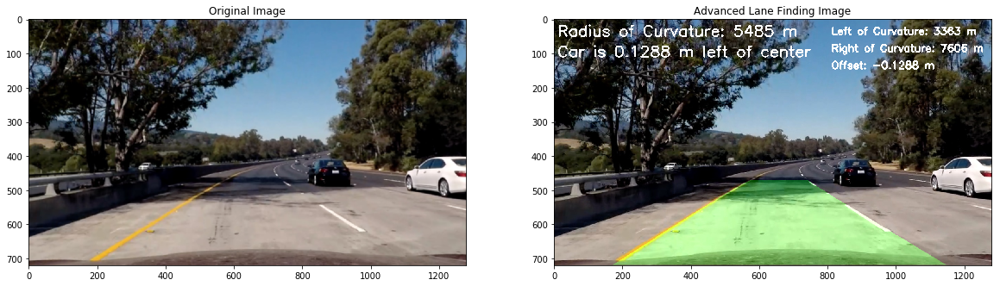

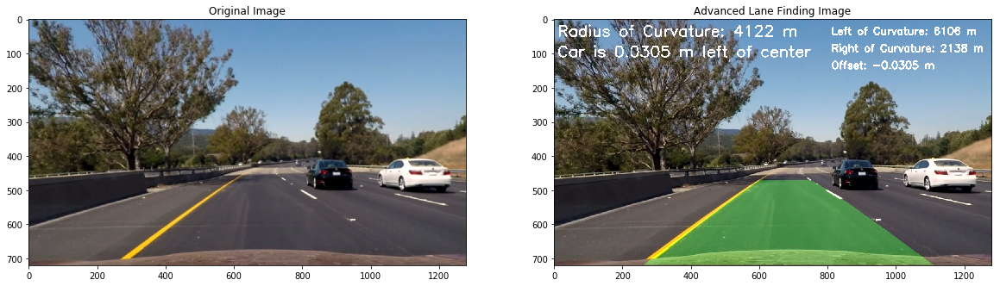

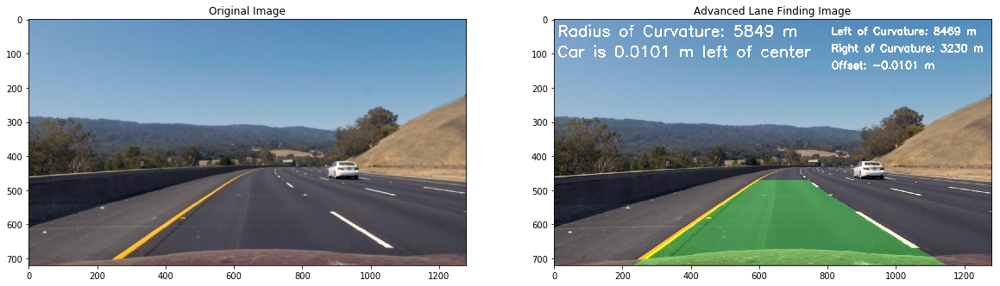

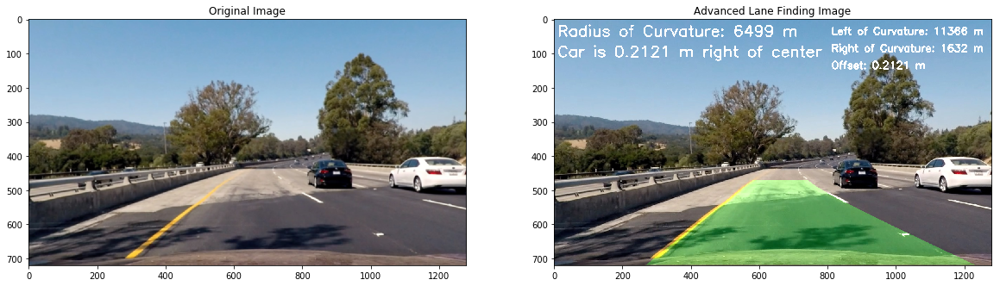

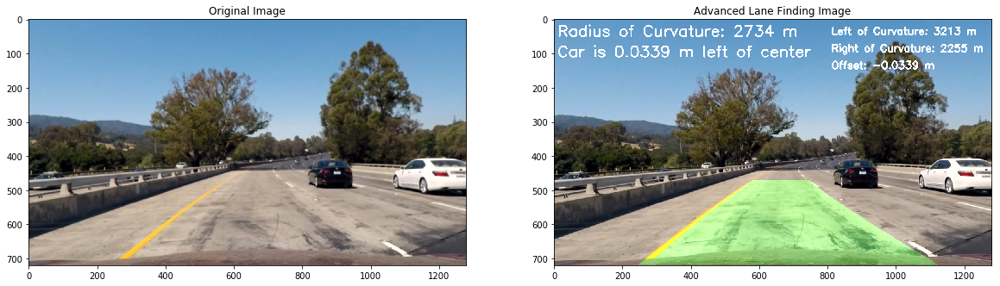

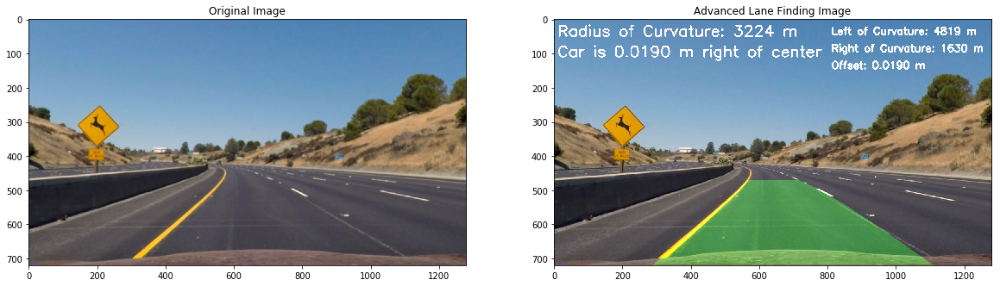

In [29]:
# Make a list of images

images = glob.glob('test_images/test*.jpg')

for index, fname in enumerate (images):
    img = mpimg.imread(fname)
    undst,ori = cal_undistort(img,mtx,dist) # get undistorted
    threshold_bin, ori = threshold(15,undst) #get thresholded, undistorted binary image
    warped,Minv = perspective_transformation(threshold_bin) #get warped, thresholded, undistorted binary image
    left_fit, right_fit, out_img, ploty = fit_polynomial(warped) #line, polynomial fitting

    #line, polynomial fitting but reduce sliding window method
    left_fit, right_fit, result, ploty = lane_detection(left_fit, right_fit, out_img)  

    left_curverad, right_curverad, radius = measure_curvature_real(left_fit, right_fit, ploty)# get measurements
    offset = measure_offset (result, left_fit, right_fit, ploty) # if positive, to the right, negative, to the left

    result = draw(left_fit, right_fit, ploty, Minv, warped, undst) #project line detection on image

    final = add_display(result, left_curverad, right_curverad, radius, offset) #add measurement texts


    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(ori)
    ax1.set_title('Original Image')
    ax2.imshow(final)
    ax2.set_title('Advanced Lane Finding Image') 

## Define a pipeline

In [30]:
def pipeline(img):
    
    # global variables to store the polynomial coefficients of the line detected in the last frame
    global left_fit
    global right_fit
    
    undst,ori = cal_undistort(img,mtx,dist) # get undistorted
    threshold_bin, ori = threshold(15,undst) #get thresholded, undistorted binary image
    warped,Minv = perspective_transformation(threshold_bin) #get warped, thresholded, undistorted binary image
    left_fit, right_fit, out_img, ploty = fit_polynomial(warped) #line, polynomial fitting

    #line, polynomial fitting but reduce sliding window method
    left_fit, right_fit, result, ploty = lane_detection(left_fit, right_fit, out_img)  

    left_curverad, right_curverad, radius = measure_curvature_real(left_fit, right_fit, ploty)# get measurements
    offset = measure_offset (result, left_fit, right_fit, ploty) # if positive, to the right, negative, to the left

    result = draw(left_fit, right_fit, ploty, Minv, warped, undst) #project line detection on image

    final = add_display(result, left_curverad, right_curverad, radius, offset) #add measurement texts
    
    return final


## Save plotted figures for visualization of pipeline

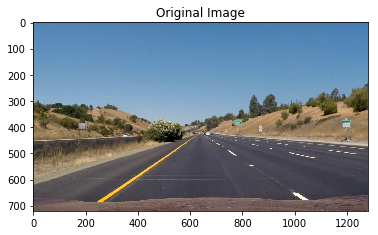

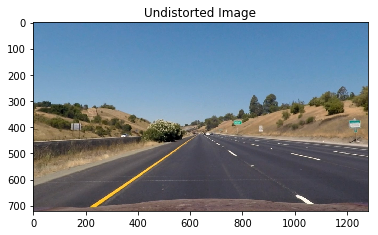

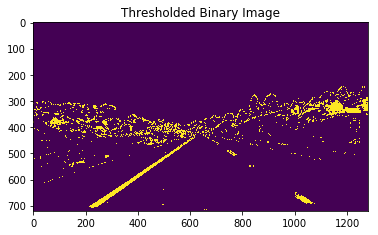

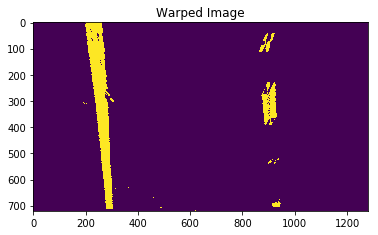

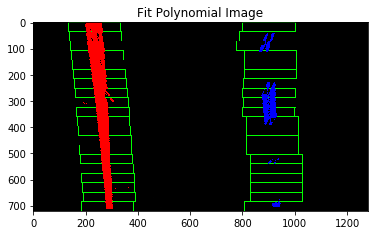

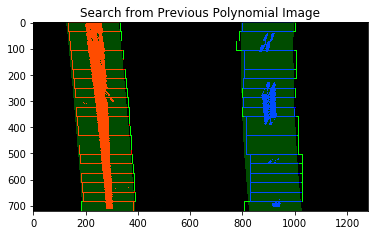

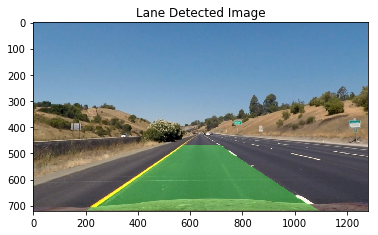

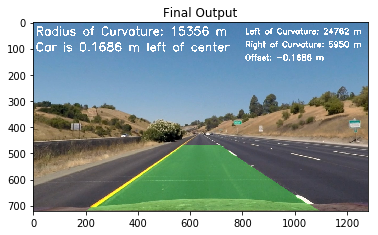

In [40]:
#Pipeline 

img = mpimg.imread('test_images/straight_lines1.jpg')   

undst,ori = cal_undistort(img,mtx,dist) # get undistorted
mpimg.imsave('output_images/1.undistorted.jpg',undst)
plt.imshow(ori)
plt.title('Original Image')
plt.show()

plt.imshow(undst)
plt.title('Undistorted Image')
plt.show()


threshold_bin, ori = threshold(15,undst) #get thresholded, undistorted binary image
mpimg.imsave('output_images/2.threshold_bin.jpg',threshold_bin)
plt.imshow(threshold_bin)
plt.title('Thresholded Binary Image')
plt.show()

warped,Minv = perspective_transformation(threshold_bin) #get warped, thresholded, undistorted binary image
mpimg.imsave('output_images/3.warped.jpg',warped)
plt.imshow(warped)
plt.title('Warped Image')
plt.show()


left_fit, right_fit, out_img, ploty = fit_polynomial(warped) #line, polynomial fitting
mpimg.imsave('output_images/4.fit_polynomial.jpg',out_img)
plt.imshow(out_img)
plt.title('Fit Polynomial Image')
plt.show()

#line, polynomial fitting but reduce sliding window method
left_fit, right_fit, result, ploty = lane_detection(left_fit, right_fit, out_img)
mpimg.imsave('output_images/5.search_from_previous_frame.jpg',result)
plt.imshow(result)
plt.title('Search from Previous Polynomial Image')
plt.show()

left_curverad, right_curverad, radius = measure_curvature_real(left_fit, right_fit, ploty)# get measurements
offset = measure_offset (result, left_fit, right_fit, ploty) # if positive, to the right, negative, to the left

result2 = draw(left_fit, right_fit, ploty, Minv, warped, undst) #project line detection on image
mpimg.imsave('output_images/6.lane_detected.jpg',result2)
plt.imshow(result2)
plt.title('Lane Detected Image')
plt.show()

final = add_display(result2, left_curverad, right_curverad, radius, offset) #add measurement texts
mpimg.imsave('output_images/7.final.jpg',final)
plt.imshow(final)
plt.title('Final Output')
plt.show()
    


## Test on Videos

In [33]:
project_video_output = 'project_video_output.mp4'

## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("project_video.mp4").subclip(0,5)


clip1 = VideoFileClip("project_video.mp4")
output_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time output_clip.write_videofile(project_video_output, audio=False)


[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [13:18<00:00,  1.60it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 10min 10s, sys: 1min 1s, total: 11min 11s
Wall time: 13min 21s


In [43]:
# Play video inline, or find video in directory

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_video_output))

## Challenge Video

In [35]:
challenge_video_output = 'challenge_video_output.mp4'

## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("challenge_video.mp4").subclip(0,2)


clip1 = VideoFileClip("challenge_video.mp4")
output_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time output_clip.write_videofile(challenge_video_output, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████| 485/485 [05:25<00:00,  1.59it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 4min 6s, sys: 29 s, total: 4min 35s
Wall time: 5min 28s


In [44]:
# Play video inline, or find video in directory

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_video_output))

## Harder Challenge Video

In [37]:
harder_challenge_video_output = 'harder_challenge_video_output.mp4'

## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("challenge_video.mp4").subclip(0,2)


clip1 = VideoFileClip("harder_challenge_video.mp4")
output_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time output_clip.write_videofile(harder_challenge_video_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|█████████▉| 1199/1200 [15:49<00:00,  1.13it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 11min 30s, sys: 1min 22s, total: 12min 53s
Wall time: 15min 54s


In [45]:
# Play video inline, or find video in directory

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(harder_challenge_video_output))